In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import spyglass as nd
import pandas as pd
# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting shijiegu@lmf-db.cin.ucsf.edu:3306


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import logging
import os
import cupy as cp

FORMAT = '%(asctime)s %(message)s'

logging.basicConfig(level='INFO', format=FORMAT, datefmt='%d-%b-%y %H:%M:%S')

In [4]:
from spyglass.common import (Session, IntervalList,IntervalPositionInfo,
                             LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,LFPBand,interval_list_intersect)
from spyglass.common.common_interval import _intersection
from spyglass.common.common_position import IntervalLinearizedPosition

import spyglass.spikesorting as ss
from spyglass.spikesorting import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,
                                   CuratedSpikeSortingSelection,CuratedSpikeSorting,Curation)
from spyglass.decoding.clusterless import (UnitMarks,
                                           UnitMarkParameters,UnitMarksIndicatorSelection,
                                          UnitMarksIndicator)
from spyglass.common.nwb_helper_fn import get_nwb_copy_filename
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection

from replay_trajectory_classification.environments import Environment
from spyglass.common.common_position import TrackGraph
from spyglass.decoding.clusterless import ClusterlessClassifierParameters
from replay_trajectory_classification import ClusterlessClassifier



import pprint
# Here are the analysis tables specific to Shijie Gu
from spyglass.Analysis_SGU import TrialChoice,Decode

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/seaborn/rcmod.py:82: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


In [5]:
nwb_copy_file_name = 'molly20220420_.nwb'

In [6]:
def interval_union(interval_list1,interval_list2):
    '''
    interval_list1 : np.array, (N,2) where N = number of intervals
    interval_list2 : np.array, (N,2) where N = number of intervals
    
    e.g.
    interval_list1 = np.array([[1,11],[6,8],[12,20],[25,30]])
    interval_list2 = np.array([[1,10]])
    
    Returns
    -------
    interval_list: np.array, (N,2)

    '''
    interval_list1=interval_list1.tolist()
    interval_list2=interval_list2.tolist()
    
    # find all pairwise intersections
    intersect_tally=np.zeros((len(interval_list1),len(interval_list2)))
    for i in range(len(interval_list1)):
        for j in range(len(interval_list2)):
            if _intersection(interval_list1[i],interval_list2[j]) is not None:
                intersect_tally[i,j]=1

    union_set=[]
    union_list2_ind=np.argwhere(np.sum(intersect_tally,axis=0)==0).ravel()
    union_list1_ind=np.argwhere(np.sum(intersect_tally,axis=1)==0).ravel()

    # for those in set 1 or set 2 that has no intersections, append zero row sum or column sum 
    for i in union_list1_ind:
        union_set.append(interval_list1[i])
    for i in union_list2_ind:
        union_set.append(interval_list2[i])
    
    # for those that has intersections, find mutually intersecting interva;s
    for i in np.argwhere(np.sum(intersect_tally,axis=1)!=0).ravel():
        intvl_1=np.array([interval_list1[i]])
        
        intvl_1s=[]
        # first, find the intersecting one in set 2
        j_all=np.argwhere(intersect_tally[i,:]).ravel()
        intvl_2s=np.array([interval_list2[j] for j in j_all])
        
        # then track back in set 1, to find all the ones in set 1 intersecting this one in set 2
        for j in j_all:
            i_all=np.argwhere(intersect_tally[:,j]).ravel()
            for i in i_all:
                intvl_1s.append(interval_list1[i])
        
        # put all the related/intersecting intervals together, find union
        union_tmp=np.concatenate([np.array(intvl_1s),intvl_2s],axis=0)
        
        union_set.append([np.min(union_tmp[:,0]),np.max(union_tmp[:,1])])
    union_set=np.unique(union_set,axis=0)   
    return union_set

In [7]:
def thresholder_sort(sort_interval_name):
    artifact_params_name='ampl_100_prop_05_2ms'
    #sort_interval_name='04_Seq2Session2'

    artifact_key=(ArtifactDetection() & {'nwb_file_name' : nwb_copy_file_name} 
                              & {'artifact_params_name': artifact_params_name}
                              & {'sort_interval_name':sort_interval_name})
    # fetch, and there should be 2 entries, one from left cannula (group 100), and one from right cannula (group 101)
    artifact_removed_name_list=artifact_key.fetch('artifact_removed_interval_list_name')
    assert len(artifact_removed_name_list)==2

    artifact_time_list=[]
    artifact_removed_time_list=[]
    for artifact_removed_name in artifact_removed_name_list:
        artifact_time_list.append((ArtifactDetection() & {'nwb_file_name' : nwb_copy_file_name,'artifact_removed_interval_list_name':artifact_removed_name}).fetch1('artifact_times'))
        artifact_removed_time_list.append((IntervalList() & {'nwb_file_name' : nwb_copy_file_name,'interval_list_name':artifact_removed_name}).fetch1('valid_times'))

    artifact_time_list=interval_union(artifact_time_list[0],artifact_time_list[1])
    artifact_removed_time_list=interval_list_intersect(artifact_removed_time_list[0],artifact_removed_time_list[1])
    
    # find tetrodes
    tetrode_with_cell=np.unique((SpikeSortingRecordingSelection & {'nwb_file_name':nwb_copy_file_name}).fetch('sort_group_id'))
    tetrode_with_cell=np.setdiff1d(tetrode_with_cell,[100,101])
    
    # insert into individual tetrodes ArtifactRemovedIntervalList
    artifact_params_name='ampl_1500_prop_075_1ms'
    sorting_keys=[]
    for tetrode in tetrode_with_cell:
        print(tetrode)
        artifact_key = {'nwb_file_name' : nwb_copy_file_name,
                    'sort_interval_name' : sort_interval_name,
                    'sort_group_id' : tetrode,
                    'preproc_params_name': 'franklab_tetrode_hippocampus',
                    'team_name': 'Shijie Gu'}                    
        artifact_key['artifact_params_name'] = artifact_params_name

        ArtifactDetectionSelection.insert1(artifact_key, skip_duplicates=True)

        artifact_key['artifact_times']=artifact_time_list
        artifact_key['artifact_removed_valid_times']=artifact_removed_time_list

        artifact_name=(nwb_copy_file_name+'_'+sort_interval_name+'_'+str(artifact_key['sort_group_id'])+'_'+
                       artifact_key['preproc_params_name']+'_'+artifact_params_name+'_artifact_removed_valid_times')

        artifact_key['artifact_removed_interval_list_name']=artifact_name

        ArtifactRemovedIntervalList().insert1(artifact_key,skip_duplicates=True)

        IntervalList().insert1({'nwb_file_name' : nwb_copy_file_name,
                               'interval_list_name':artifact_name,
                               'valid_times':artifact_removed_time_list},skip_duplicates=True)

        artifact_key.pop('artifact_params_name')
        artifact_key.pop('artifact_times')
        artifact_key.pop('artifact_removed_valid_times')

        artifact_key['sorter'] = 'clusterless_thresholder'
        artifact_key['sorter_params_name'] = 'default'

        SpikeSortingSelection.insert1(artifact_key, skip_duplicates=True)

        sorting_keys.append(artifact_key.copy())
    
    # populate
    SpikeSorting.populate({'nwb_file_name':nwb_copy_file_name,
                    'artifact_params_name': artifact_params_name, # make sure to inlude this
                    'sort_interval_name':sort_interval_name})
    return sorting_keys

In [8]:
parameters = (ClusterlessClassifierParameters() & {'classifier_param_name': 'default_decoding_gpu'}).fetch1()

track_graph = (TrackGraph() & {'track_graph_name': '4 arm lumped'}).get_networkx_track_graph()
track_graph_params = (TrackGraph() & {'track_graph_name': '4 arm lumped'}).fetch1()

parameters['classifier_params']['environments'] = [
    Environment(
    track_graph=track_graph,
    edge_order=track_graph_params['linear_edge_order'],
    edge_spacing=track_graph_params['linear_edge_spacing'])]

parameters['classifier_params']['clusterless_algorithm'] = 'multiunit_likelihood_integer'
parameters['classifier_params']['clusterless_algorithm_params'] = {
    'mark_std': 24.0,
    'position_std': 6.0,
    'block_size': 100,
 }

pprint.pprint(parameters)

{'classifier_param_name': 'default_decoding_gpu',
 'classifier_params': {'clusterless_algorithm': 'multiunit_likelihood_integer',
                       'clusterless_algorithm_params': {'block_size': 100,
                                                        'mark_std': 24.0,
                                                        'position_std': 6.0},
                       'continuous_transition_types': [[RandomWalk(environment_name='', movement_var=6.0, movement_mean=0.0, use_diffusion=False),
                                                        Uniform(environment_name='', environment2_name=None)],
                                                       [Uniform(environment_name='', environment2_name=None),
                                                        Uniform(environment_name='', environment2_name=None)]],
                       'discrete_transition_type': DiagonalDiscrete(diagonal_value=0.98),
                       'environments': [Environment(environment_name='', 

## Marks

The first thing we need are the marks for the clusterless decoding. First, sort spikes by thresholder.


In [9]:
# select position timestamps, only maze sessions are selected
IntervalList_pd=pd.DataFrame(IntervalList & {'nwb_file_name': nwb_copy_file_name})
position_interval=[]
session_interval=[]
for i in IntervalList_pd.index:
    interval=IntervalList_pd['interval_list_name'][i]
    if interval[-8:-1]=='Session':
        session_interval.append(interval)
        pos_interval='pos '+str(int(interval[0:2])-1)+' valid times'
        position_interval.append(pos_interval)

In [10]:
def interpolate_position(marks_df,position_df):
    colnames=position_df.columns.tolist()
    d={}
    for colname in colnames:
        interp_column=np.interp(np.array(marks_df.time), 
                               np.array(position_df.index),
                               np.array(position_df.loc[:,colname]))
        d[colname]=interp_column
    df = pd.DataFrame(data=d)
    df.index=np.array(marks_df.time)
    df.index.name = 'time'
    
    return df

In [ ]:
for session_ind in range(len(session_interval)):
    
    session=session_interval[session_ind]
    print('session',session)
    '''
    detect spikes
    '''
    sorting_keys=thresholder_sort(session)

    '''
    skip curation
    '''
    curation_keys = [Curation.insert_curation(key) for key in sorting_keys]
    
    CuratedSpikeSortingSelection().insert(
            curation_keys,
            skip_duplicates=True)
    CuratedSpikeSorting.populate(
            CuratedSpikeSortingSelection() & curation_keys)
    
    '''
    populate UnitMarks table
    '''
    mark_parameters_keys = pd.DataFrame(CuratedSpikeSorting & curation_keys)
    mark_parameters_keys['mark_param_name'] = 'default'
    mark_parameters_keys = (mark_parameters_keys
                            .loc[:, UnitMarkParameters.primary_key]
                            .to_dict('records'))
    UnitMarkParameters().insert(
        mark_parameters_keys,
        skip_duplicates=True)
    
    UnitMarks.populate(UnitMarkParameters & mark_parameters_keys)
    
    '''
    include position info
    '''

    pos_interval = (
            IntervalList &
            {'nwb_file_name': nwb_copy_file_name,
             'interval_list_name': position_interval[session_ind]})

    marks_selection = ((UnitMarks & mark_parameters_keys) * pos_interval)
    marks_selection = (pd.DataFrame(marks_selection)
                       .loc[:, marks_selection.primary_key]
                       .to_dict('records'))
    UnitMarksIndicatorSelection.insert(marks_selection, skip_duplicates=True)
    UnitMarksIndicator.populate(marks_selection)
    
    '''
    match position
    '''
    sort_interval_name=session
    pos_interval_name=position_interval[session_ind]

    key = {}
    key['interval_list_name'] = sort_interval_name
    key['nwb_file_name'] = nwb_copy_file_name
    

    interval = (IntervalList &
                {'nwb_file_name': key['nwb_file_name'],
                 'interval_list_name': key['interval_list_name']}
               ).fetch1('valid_times')

    valid_ephys_times = (IntervalList &
                         {'nwb_file_name': key['nwb_file_name'],
                          'interval_list_name': 'raw data valid times'}
                        ).fetch1('valid_times')

    valid_pos_times = (IntervalList &
                       {'nwb_file_name': key['nwb_file_name'],
                        'interval_list_name': pos_interval_name}
                      ).fetch1('valid_times')

    intersect_interval = interval_list_intersect(
        interval_list_intersect(interval, valid_ephys_times), valid_pos_times)

    
    marks = (UnitMarksIndicator & {
        'nwb_file_name': nwb_copy_file_name,
        'interval_list_name': pos_interval_name}).fetch_xarray()
    
    linear_position_df = (IntervalLinearizedPosition() &
                          {'nwb_file_name': nwb_copy_file_name,
                           'interval_list_name': pos_interval_name,
                           'position_info_param_name': 'default_decoding'}
                         ).fetch1_dataframe()
    
    marks_=[]
    linear_position_df_=[]
    for i in range(len(intersect_interval)):
        valid_time_slice = slice(intersect_interval[i][0], intersect_interval[i][1])
        position_df=linear_position_df.loc[valid_time_slice]
        marks_df=marks.sel(time=valid_time_slice)
        
        position_df=interpolate_position(marks_df,position_df)
        
        linear_position_df_.append(position_df)
        marks_.append(marks_df)

    marks=xr.concat(marks_,dim='time')
    linear_position_df=pd.concat(linear_position_df_)
    marks.shape, linear_position_df.shape
    
    '''
    decode
    '''
    GPU_ID = 8

    # use context manager to specify which GPU (device)
    with cp.cuda.Device(GPU_ID):

        classifier = ClusterlessClassifier(**parameters['classifier_params'])
        classifier.fit(
            position=linear_position_df.linear_position.values,
            multiunits=marks.values,
            **parameters['fit_params']
        )
        results = classifier.predict(
            multiunits=marks.values,
            time=linear_position_df.index,
            **parameters['predict_params']
        )
        logging.info('Done!')

        results
    
    decode_path=os.path.join('/stelmo/shijie/recording_pilot/molly/decoding',nwb_copy_file_name+sort_interval_name+'.nc')
    results.to_netcdf(decode_path)

    key={'nwb_file_name':nwb_copy_file_name,
         'interval_list_name':sort_interval_name,
         'posterior':decode_path}
    Decode().insert1(key,replace=True)

session 02_Seq2Session1
0
2
3
6
7
9
10
12
15
17
18
20
24
25
27
34
35
37
39
40
41
46
50
52
53
55
56
60
61


09-Jul-22 22:47:45 Found 29 keys to populate
09-Jul-22 22:47:45 Transaction started
09-Jul-22 22:47:45 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 0, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 0, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpm88t2ugo'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:47:57 Transaction committed and closed.
09-Jul-22 22:47:57 Transaction started
09-Jul-22 22:47:57 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 2, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 2, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpl2nupm9b'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:48:08 Transaction committed and closed.
09-Jul-22 22:48:08 Transaction started
09-Jul-22 22:48:08 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 3, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 3, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpduwjjowb'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:48:20 Transaction committed and closed.
09-Jul-22 22:48:20 Transaction started
09-Jul-22 22:48:20 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 6, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 6, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpss9b7lkp'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:48:31 Transaction committed and closed.
09-Jul-22 22:48:31 Transaction started
09-Jul-22 22:48:31 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 7, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 7, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpq6xk4scw'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:48:42 Transaction committed and closed.
09-Jul-22 22:48:42 Transaction started
09-Jul-22 22:48:42 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 9, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 9, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp4p4gbvqr'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:48:52 Transaction committed and closed.
09-Jul-22 22:48:52 Transaction started
09-Jul-22 22:48:52 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 10, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 10, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmplp8y44qq'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:49:03 Transaction committed and closed.
09-Jul-22 22:49:03 Transaction started
09-Jul-22 22:49:03 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 12, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 12, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpt3sliky6'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:49:13 Transaction committed and closed.
09-Jul-22 22:49:13 Transaction started
09-Jul-22 22:49:13 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 15, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 15, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpkf3s0c28'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:49:24 Transaction committed and closed.
09-Jul-22 22:49:24 Transaction started
09-Jul-22 22:49:24 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 17, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 17, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpr73ihaxa'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:49:37 Transaction committed and closed.
09-Jul-22 22:49:37 Transaction started
09-Jul-22 22:49:37 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 18, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 18, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpw_axlg1b'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:49:49 Transaction committed and closed.
09-Jul-22 22:49:49 Transaction started
09-Jul-22 22:49:49 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 20, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_20_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 20, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_20_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmphix2u0k_'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:49:59 Transaction committed and closed.
09-Jul-22 22:49:59 Transaction started
09-Jul-22 22:49:59 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 24, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_24_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 24, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_24_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpac5dr71d'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:50:12 Transaction committed and closed.
09-Jul-22 22:50:12 Transaction started
09-Jul-22 22:50:12 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 25, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_25_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 25, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_25_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpar5og76o'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:50:29 Transaction committed and closed.
09-Jul-22 22:50:29 Transaction started
09-Jul-22 22:50:29 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 27, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_27_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 27, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_27_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp8iec2vac'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:50:50 Transaction committed and closed.
09-Jul-22 22:50:50 Transaction started
09-Jul-22 22:50:50 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 34, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_34_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 34, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_34_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmphsu5mlb3'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:51:19 Transaction committed and closed.
09-Jul-22 22:51:19 Transaction started
09-Jul-22 22:51:19 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 35, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_35_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 35, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_35_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpi35bqbz2'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:51:31 Transaction committed and closed.


Saving sorting results...


09-Jul-22 22:51:31 Transaction started
09-Jul-22 22:51:31 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 37, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_37_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 37, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_37_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpow82z3ii'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:51:42 Transaction committed and closed.
09-Jul-22 22:51:42 Transaction started
09-Jul-22 22:51:42 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 39, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_39_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 39, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_39_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmphtu9h3fy'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:51:53 Transaction committed and closed.
09-Jul-22 22:51:53 Transaction started
09-Jul-22 22:51:53 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 40, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_40_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 40, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_40_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpav1ypx7t'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:52:05 Transaction committed and closed.
09-Jul-22 22:52:05 Transaction started
09-Jul-22 22:52:05 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 41, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_41_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 41, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_41_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpbqs48ddb'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:52:15 Transaction committed and closed.
09-Jul-22 22:52:15 Transaction started
09-Jul-22 22:52:15 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 46, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_46_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 46, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_46_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp8eltffmk'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:52:25 Transaction committed and closed.
09-Jul-22 22:52:25 Transaction started
09-Jul-22 22:52:25 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 50, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_50_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 50, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_50_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp05feuulg'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:52:39 Transaction committed and closed.
09-Jul-22 22:52:39 Transaction started
09-Jul-22 22:52:39 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 52, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_52_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 52, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_52_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpal6oozfq'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:52:57 Transaction committed and closed.
09-Jul-22 22:52:57 Transaction started
09-Jul-22 22:52:57 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 53, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_53_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 53, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_53_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpq0zi7dtc'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:53:09 Transaction committed and closed.
09-Jul-22 22:53:09 Transaction started
09-Jul-22 22:53:09 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 55, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_55_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 55, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_55_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp_0lox0cb'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:53:21 Transaction committed and closed.
09-Jul-22 22:53:21 Transaction started
09-Jul-22 22:53:21 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 56, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_56_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 56, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_56_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp_is0njp7'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:53:32 Transaction committed and closed.
09-Jul-22 22:53:32 Transaction started
09-Jul-22 22:53:32 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 60, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_60_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 60, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_60_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpxanv9upr'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:53:44 Transaction committed and closed.
09-Jul-22 22:53:44 Transaction started
09-Jul-22 22:53:44 Populating: {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 61, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_61_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Saving sorting results...
Running spike sorting on {'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 61, 'sort_interval_name': '02_Seq2Session1', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_02_Seq2Session1_61_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmp068cdat1'>
  _warnings.warn(warn_message, ResourceWarning)
09-Jul-22 22:53:54 Transaction committed and closed.


Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:191: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.Mapping):
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:195: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.ByteString):
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:197: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.MutableSequence):
09-Jul-22 22:53:56 Found 29 keys to populate
09-Jul-22 22:53:56 Transaction started
09-Jul-2

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_VGFMPF1TEJ.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_VGFMPF1TEJ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
09-Jul-22 22:54:00 Transaction committed and closed.
09-Jul-22 22:54:00 Transaction started
09-Jul-22 22:54:00 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_V4KPMTQHSB.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_V4KPMTQHSB.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
09-Jul-22 22:54:03 Transaction committed and closed.
09-Jul-22 22:54:03 Transaction started
09-Jul-22 22:54:04 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_531Q60CMV1.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)


In [18]:
print('done')

done


In [19]:
Decode() & {'nwb_file_name':nwb_copy_file_name}

nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,posterior posterior within that interval
molly20220420_.nwb,02_Seq2Session1,=BLOB=
molly20220420_.nwb,04_Seq2Session2,=BLOB=
molly20220420_.nwb,06_Seq2Session3,=BLOB=
molly20220420_.nwb,08_Seq2Session4,=BLOB=
molly20220420_.nwb,10_Seq2Session5,=BLOB=
molly20220420_.nwb,12_Seq2Session6,=BLOB=


### Pick one session

In [20]:
interval_list_name='06_Seq2Session3'

key={'nwb_file_name':nwb_copy_file_name,
     'interval_list_name':interval_list_name}  
results=xr.open_dataset((Decode() & key).fetch1('posterior'))

In [21]:
linear_position_df = (IntervalLinearizedPosition() &
                          {'nwb_file_name': nwb_copy_file_name,
                           'interval_list_name': 'pos 5 valid times',
                           'position_info_param_name': 'default_decoding'}
                         ).fetch1_dataframe()

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_OQVZOHO81D.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220418_GXQ65KXGYB.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


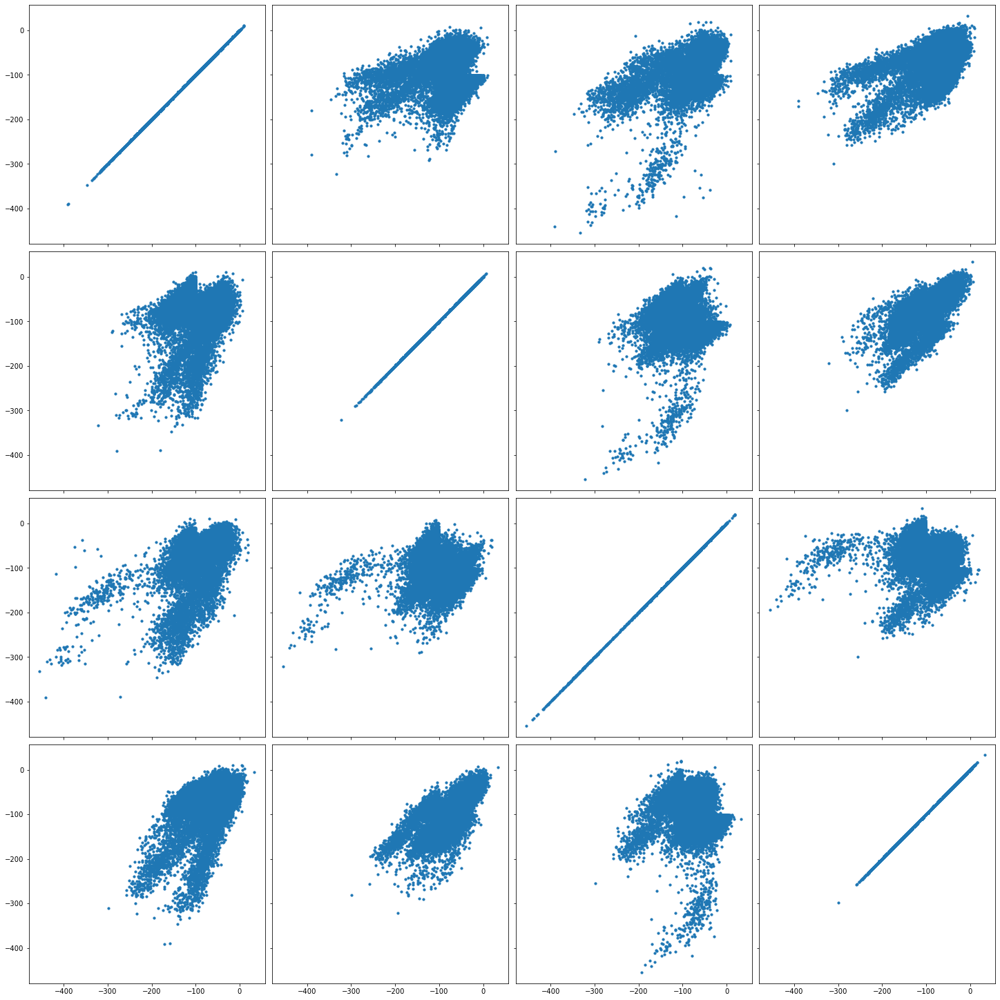

In [27]:
marks_single = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'sort_group_id': 3,
    'interval_list_name': 'pos 3 valid times',   
}).fetch_xarray()
UnitMarksIndicator.plot_all_marks(marks_single)

Finally, we can plot the decodes to make sure they make sense.

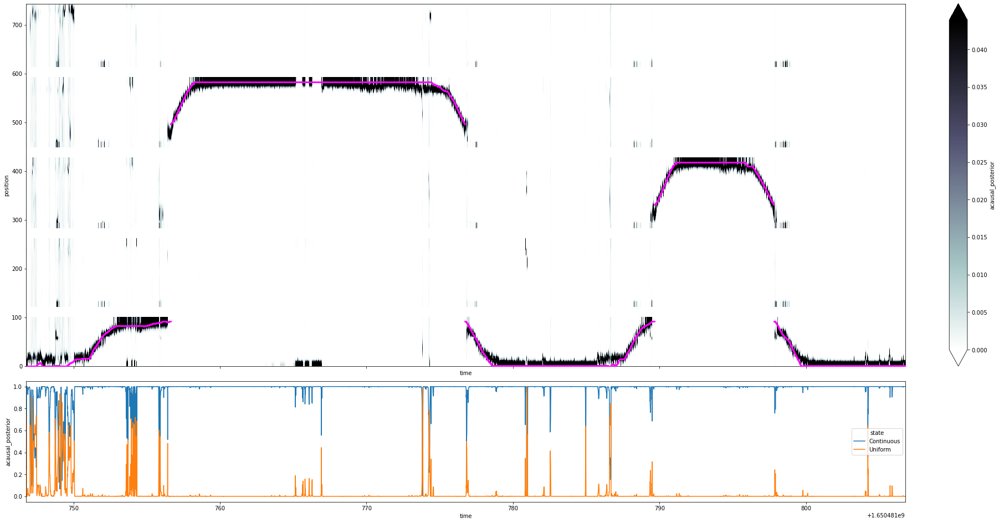

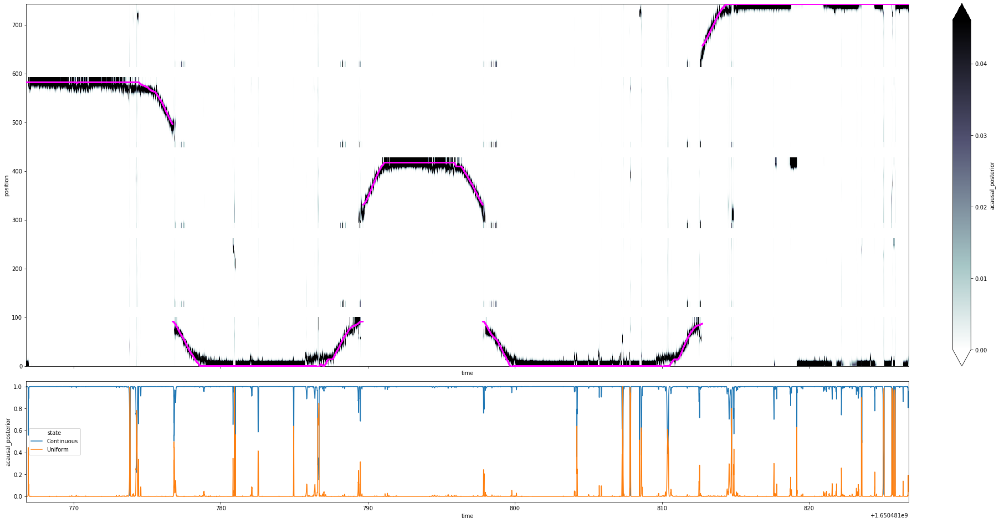

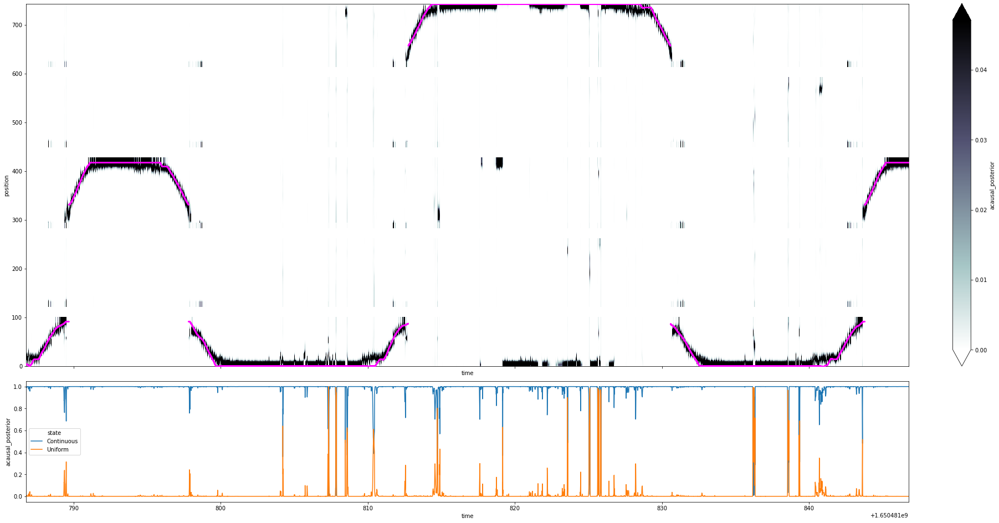

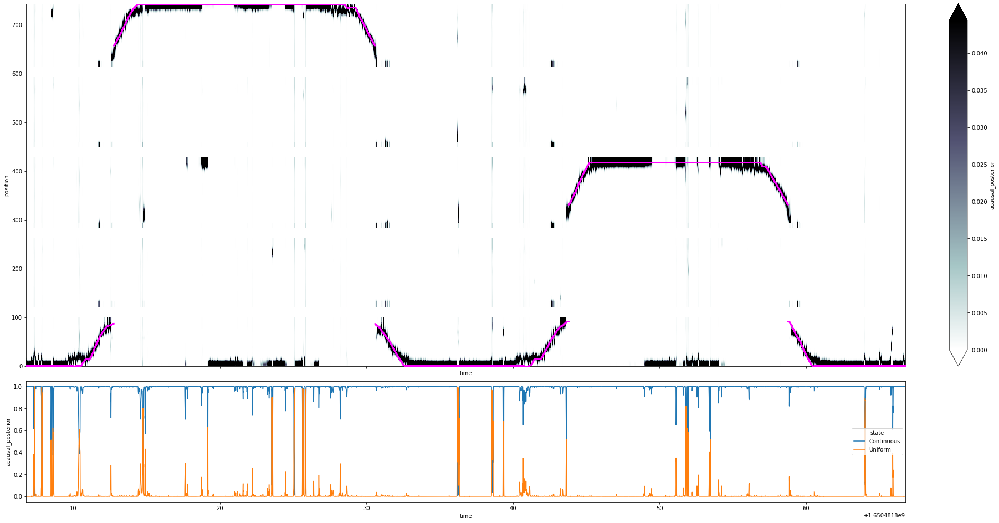

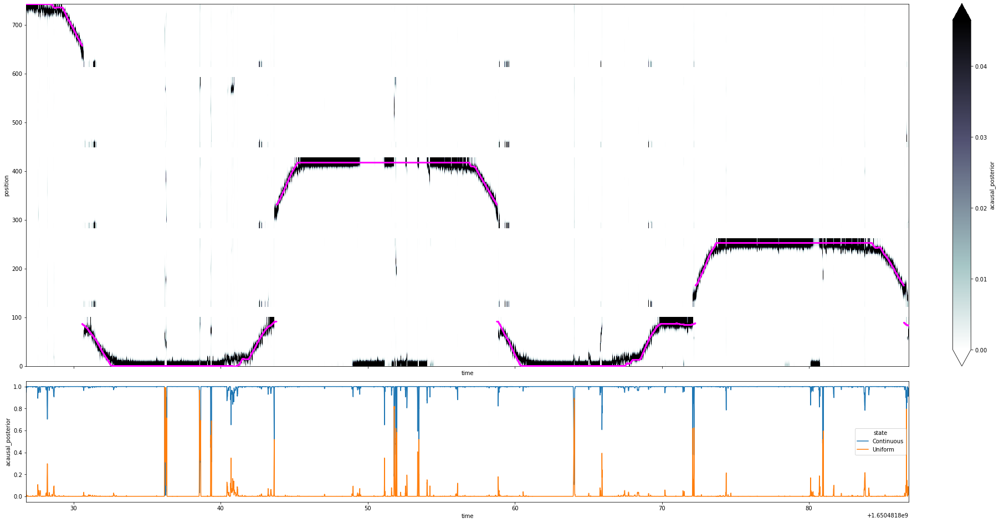

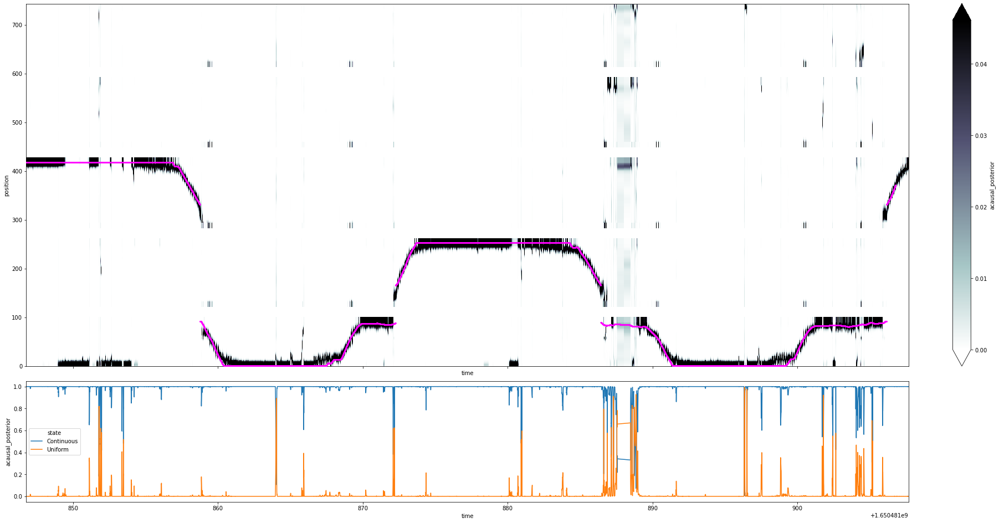

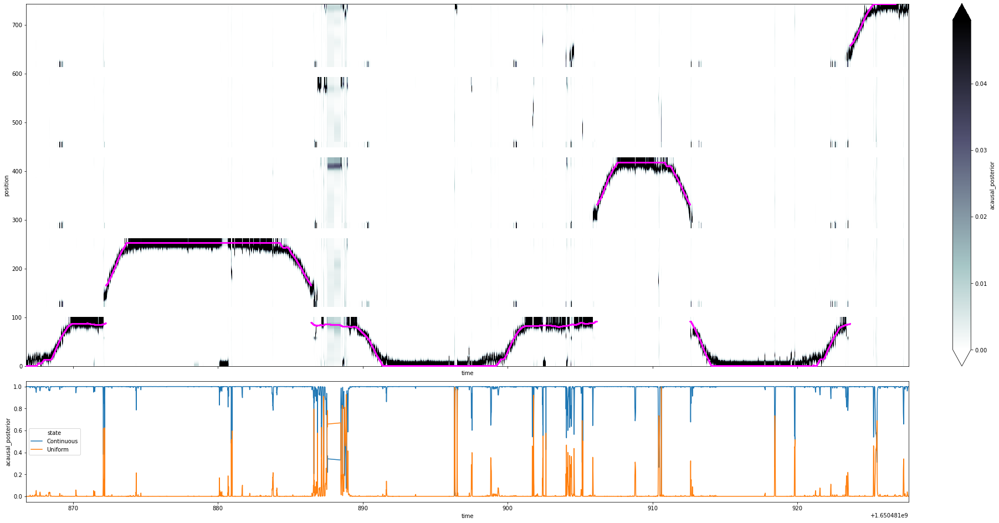

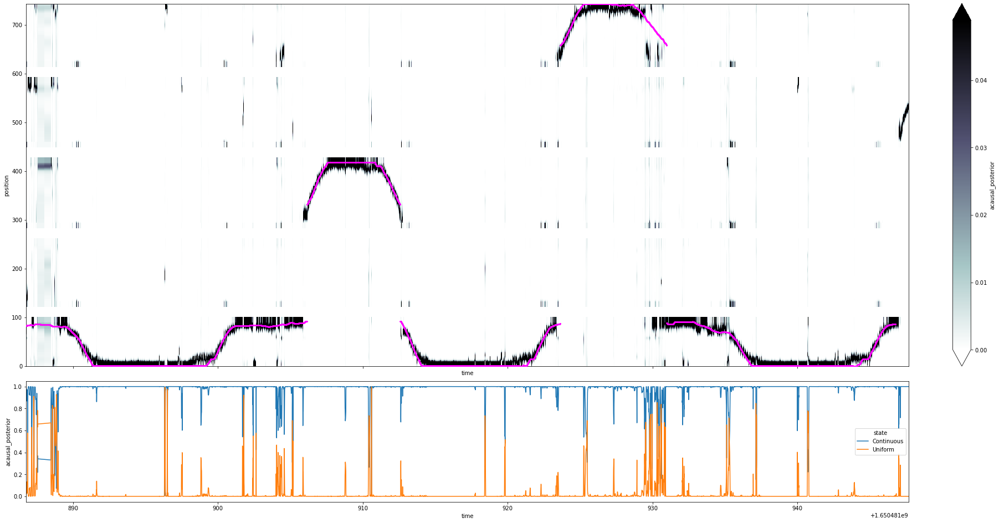

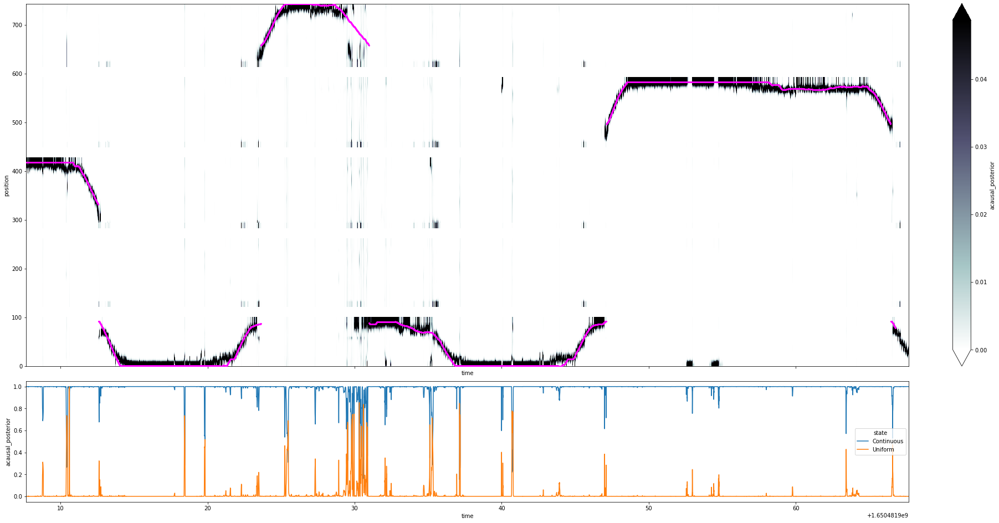

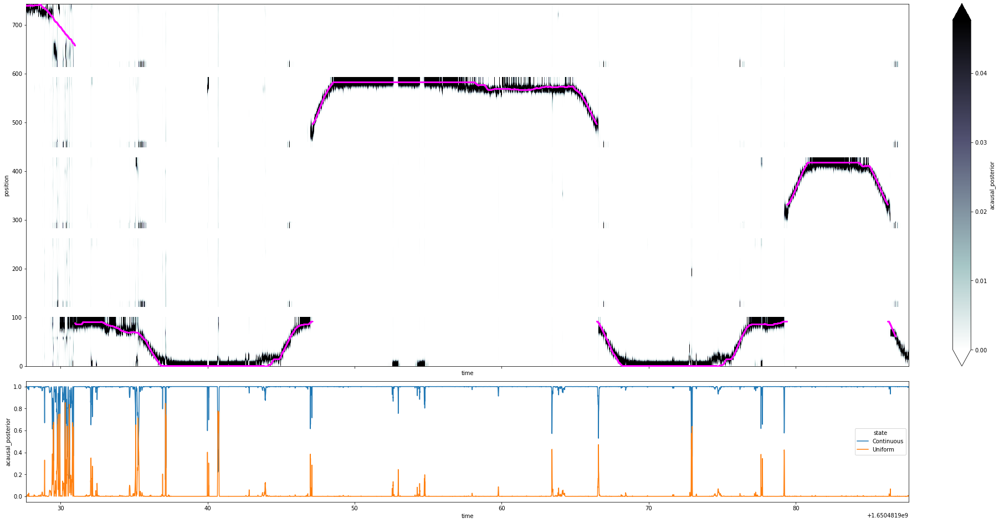

In [22]:
import matplotlib.pyplot as plt
for time_ind in range(0, 100_000, 10_000): #range(0, 600_000, 100_000)
    time_slice = slice(time_ind, time_ind + 30_000)

    fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)
    results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
    axes[0].scatter(linear_position_df.iloc[time_slice].index,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)
 
    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

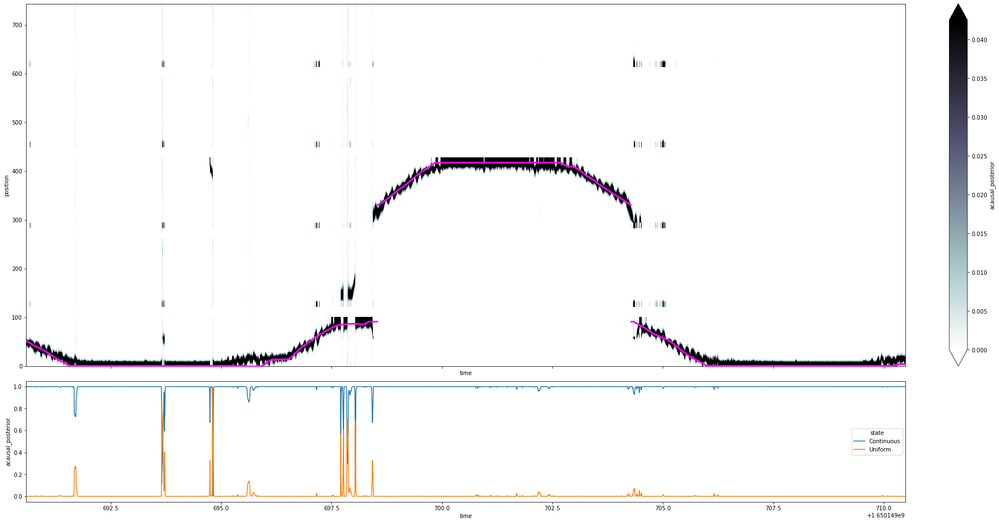

In [142]:
import matplotlib.pyplot as plt

time_slice = slice(100_050, 110_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

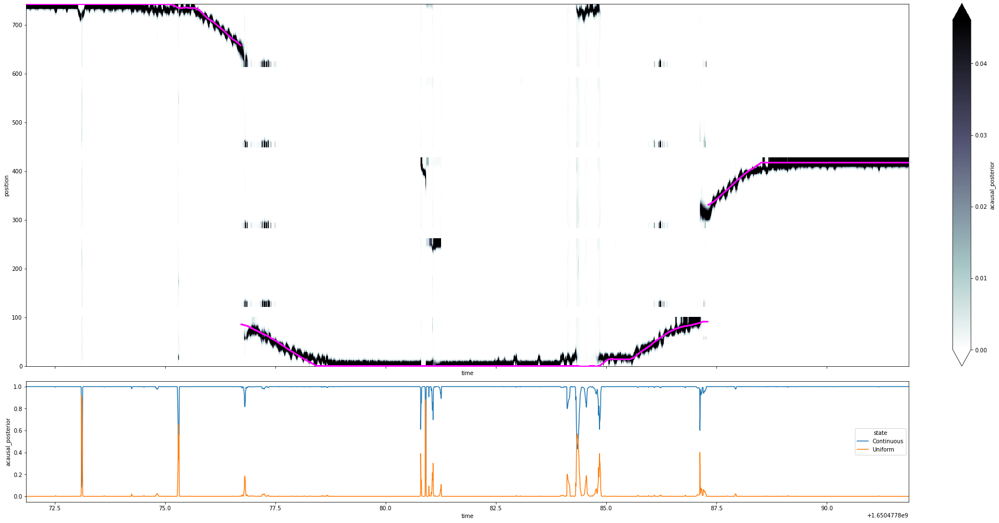

In [89]:
import matplotlib.pyplot as plt

time_slice = slice(180_000, 190_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

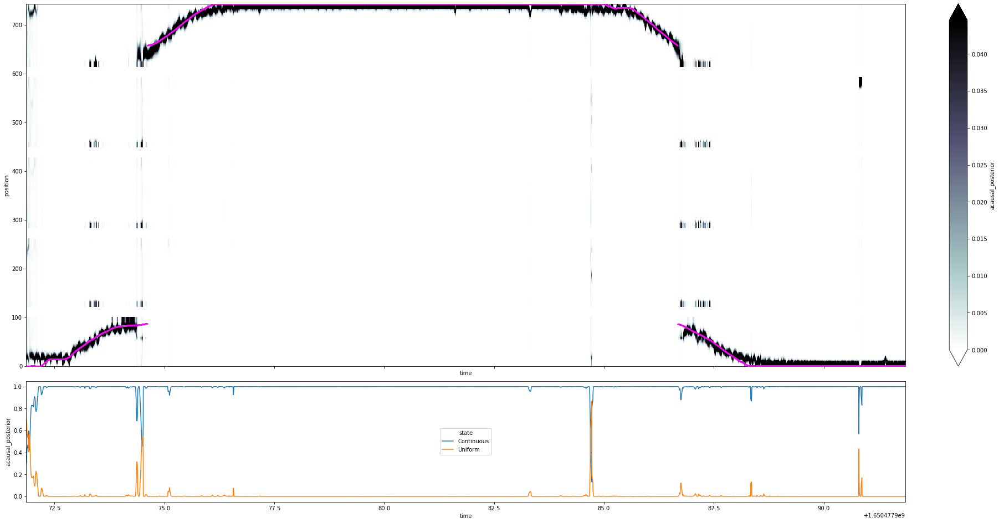

In [90]:
import matplotlib.pyplot as plt

time_slice = slice(230_000, 240_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

In [91]:
from trajectory_analysis_tools import get_trajectory_data, get_ahead_behind_distance

trajectory_data = get_trajectory_data(
    results.sum('state').acausal_posterior,
    track_graph,
    classifier,
    linear_position_df[['projected_x_position', 'projected_y_position']],
    linear_position_df.track_segment_id,
    position_info.head_orientation,
)

ahead_behind_distance = get_ahead_behind_distance(
    track_graph, *trajectory_data)
mental_position_edges = trajectory_data[-1]
mental_position_edge_id = np.asarray(
    [track_graph.edges[edge]['edge_id'] for edge in mental_position_edges])

NameError: name 'position_info' is not defined

In [30]:
from ripple_detection import get_multiunit_population_firing_rate

SAMPLING_FREQUENCY = 500

multiunit_spikes = (np.any(~np.isnan(marks.values), axis=1)
                    ).astype(float)
multiunit_firing_rate = pd.DataFrame(
    get_multiunit_population_firing_rate(
        multiunit_spikes, SAMPLING_FREQUENCY), index=marks.time,
    columns=['firing_rate'])

In [31]:
from ripple_detection import multiunit_HSE_detector

multiunit_high_synchrony_times = multiunit_HSE_detector(
    marks.time.values,
    multiunit_spikes,
    position_info.head_speed.values,
    sampling_frequency=SAMPLING_FREQUENCY,
    minimum_duration=0.015,
    zscore_threshold=2.0,
    close_event_threshold=0.000)

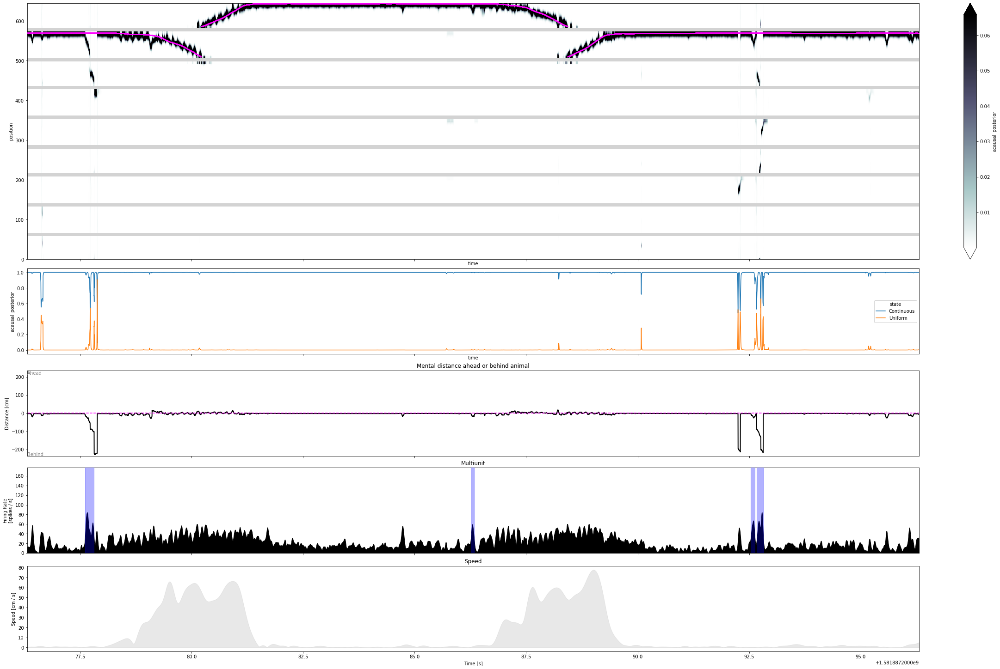

In [32]:
import matplotlib.pyplot as plt
import copy


def plot_classifier(
    time_slice,
    results,
    classifier,
    position_info,
    linear_position_df,
    ahead_behind_distance,
    multiunit_firing_rate,
    multiunit_high_synchrony_times,
    cmap='bone_r',
    figsize=(30, 20)
):

    cmap = copy.copy(plt.cm.get_cmap(cmap))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    fig, axes = plt.subplots(5, 1, figsize=figsize, sharex=True, constrained_layout=True,
                             gridspec_kw={"height_ratios": [3, 1, 1, 1, 1]},)

    time = results.isel(time=time_slice).time
    (results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[0], robust=True, cmap=cmap))
    axes[0].scatter(time,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])
    axes[2].plot(time,
                 ahead_behind_distance[time_slice],
                 color="black", linewidth=2)
    axes[2].axhline(0, color="magenta", linestyle="--")
    axes[2].set_title("Mental distance ahead or behind animal")
    axes[2].set_ylabel("Distance [cm]")
    max_dist = np.max(np.abs(ahead_behind_distance)) + 5
    axes[2].set_ylim((-max_dist, max_dist))
    axes[2].text(time[0], max_dist - 1, "Ahead", color="grey", va='top')
    axes[2].text(time[0], -max_dist + 1, "Behind", color="grey")

    # ax 3
    axes[3].fill_between(
        multiunit_firing_rate.iloc[time_slice].index.values,
        multiunit_firing_rate.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[3].set_ylabel("Firing Rate\n[spikes / s]")
    axes[3].set_title("Multiunit")
    axes[3].set_ylim((0.0, np.max(np.asarray(multiunit_firing_rate))))


    cur_multiunit_HSE = interval_list_intersect(
        np.asarray(multiunit_high_synchrony_times),
        np.asarray([(time[0], time[-1])]))

    for start_time, end_time in cur_multiunit_HSE:
        axes[3].axvspan(start_time, end_time, color='blue', alpha=0.3, zorder=10)

    # ax 4
    axes[4].fill_between(
        time,
        position_info.iloc[time_slice]
        .head_speed.values.squeeze(),
        color="lightgrey",
        linewidth=1,
        alpha=0.5,
    )
    axes[4].set_title('Speed')
    axes[4].set_ylabel("Speed [cm / s]")
    axes[4].set_xlabel("Time [s]")
    

time_slice = slice(180_000, 190_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

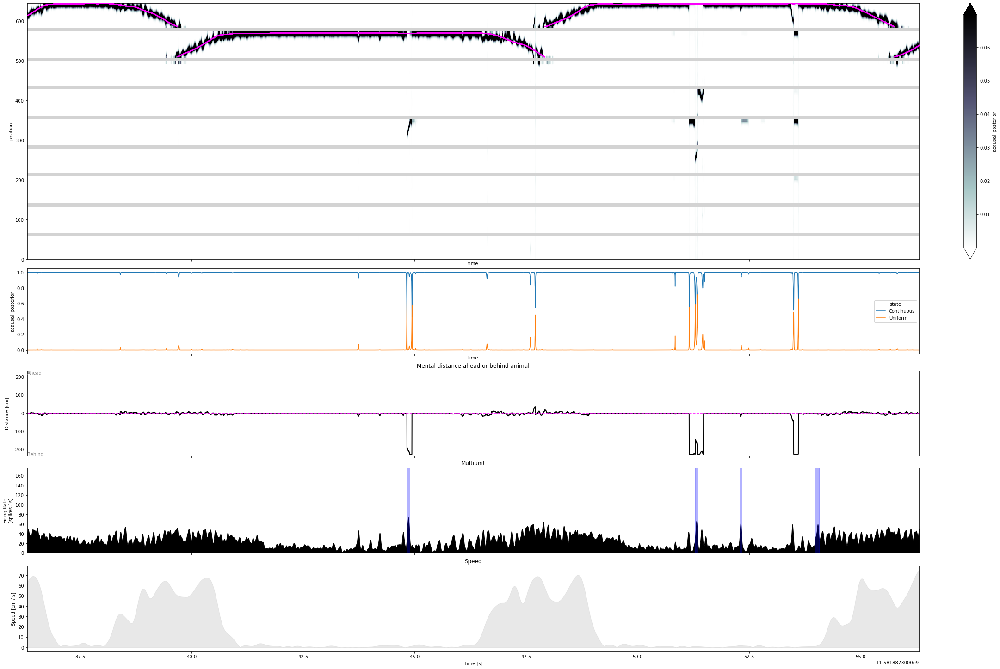

In [33]:
time_slice = slice(210_000, 220_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

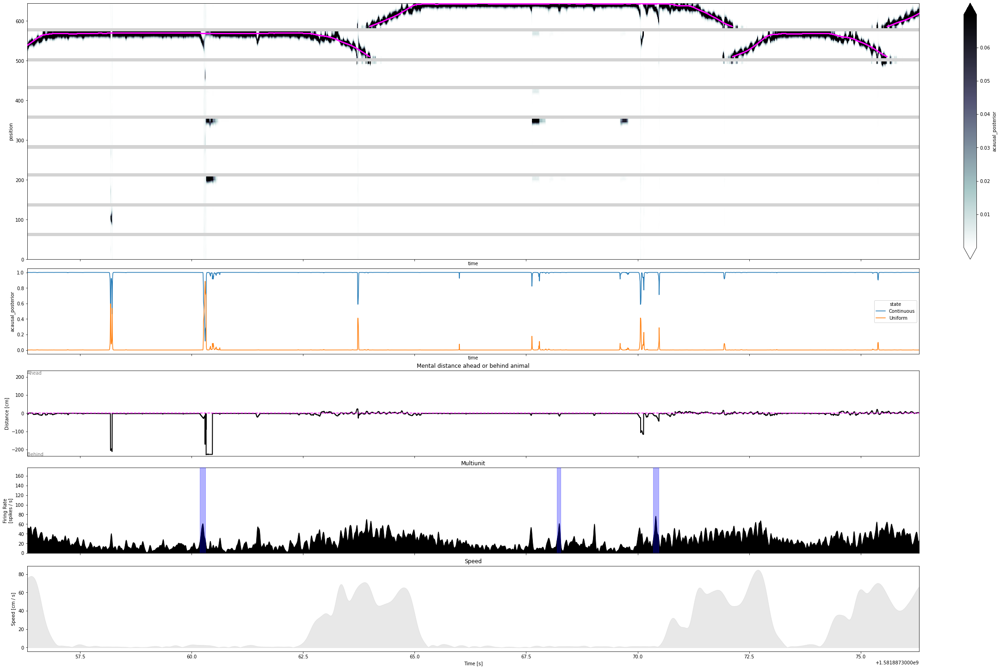

In [34]:
time_slice = slice(220_000, 230_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)